In [2]:
import pandas as pd
import pickle
parser = pd.read_csv('data/Parser.csv')
parser.head(20)

,Unnamed: 0,id,cat,tovar,mag,price,date,okrug
0,0,35BА1,Балка,Балка двутавровая 40Б Ст3,Оммет-ОМС,57400.00,2019-04-17,СФО
1,1,33ZА1,Балка,Балка двутавровая 20К Ст3,Оммет-ОМС,60000.00,2019-04-17,СФО
2,2,30VА1,Арматура,Арматура рифленая 10 А500 СП,Оммет-ОМС,48800.00,2019-04-17,СФО
3,3,43PА1,Труба,"Труба ВГП 15х2,8",Оммет-ОМС,68.99,2019-04-17,СФО
4,4,4B9А1,Угол,Уголок горячекатаный 63х63х6 Ст3,Оммет-ОМС,50900.00,2019-04-17,СФО
5,5,55OА1,Угол,Уголок горячекатаный 100х100х8 Ст3,Оммет-ОМС,49500.00,2019-04-17,СФО
6,6,35EА1,Балка,Балка двутавровая 40К Ст3,Оммет-ОМС,57500.00,2019-04-17,СФО
7,7,3I7А1,Круг,Круг горячекатаный 20 Ст3,Оммет-ОМС,42700.00,2019-04-17,СФО
8,8,43RА1,Труба,"Труба ВГП 20х2,8",Оммет-ОМС,88.35,2019-04-17,СФО
9,9,33WА1,Балка,Балка двутавровая 20Б Ст3,Оммет-ОМС,60400.00,2019-04-17,СФО


In [2]:
parser.to_csv('Parser.csv')

In [3]:
for col in parser.columns:
    print(str(col)+' имеет {} уникальных значений'.format(parser[col].nunique()))

Unnamed: 0 имеет 429899 уникальных значений
id имеет 104 уникальных значений
cat имеет 10 уникальных значений
tovar имеет 107 уникальных значений
mag имеет 53 уникальных значений
price имеет 5107 уникальных значений
date имеет 171 уникальных значений
okrug имеет 4 уникальных значений


In [4]:
parser.date = parser.date.apply(pd.to_datetime)
parser.drop(['Unnamed: 0'],axis=1,inplace=True)
parser.head(20)

,id,cat,tovar,mag,price,date,okrug
0,35BА1,Балка,Балка двутавровая 40Б Ст3,Оммет-ОМС,57400.00,2019-04-17,СФО
1,33ZА1,Балка,Балка двутавровая 20К Ст3,Оммет-ОМС,60000.00,2019-04-17,СФО
2,30VА1,Арматура,Арматура рифленая 10 А500 СП,Оммет-ОМС,48800.00,2019-04-17,СФО
3,43PА1,Труба,"Труба ВГП 15х2,8",Оммет-ОМС,68.99,2019-04-17,СФО
4,4B9А1,Угол,Уголок горячекатаный 63х63х6 Ст3,Оммет-ОМС,50900.00,2019-04-17,СФО
5,55OА1,Угол,Уголок горячекатаный 100х100х8 Ст3,Оммет-ОМС,49500.00,2019-04-17,СФО
6,35EА1,Балка,Балка двутавровая 40К Ст3,Оммет-ОМС,57500.00,2019-04-17,СФО
7,3I7А1,Круг,Круг горячекатаный 20 Ст3,Оммет-ОМС,42700.00,2019-04-17,СФО
8,43RА1,Труба,"Труба ВГП 20х2,8",Оммет-ОМС,88.35,2019-04-17,СФО
9,33WА1,Балка,Балка двутавровая 20Б Ст3,Оммет-ОМС,60400.00,2019-04-17,СФО


In [5]:
import pandas_profiling as pp
pp.ProfileReport(parser)

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [6]:
pd.set_option('display.max_columns',7)
parser_grouped_mag = parser.groupby(by=['tovar','mag'])
parser_grouped_mag.head(20)

,id,cat,tovar,mag,price,date,okrug
0,35BА1,Балка,Балка двутавровая 40Б Ст3,Оммет-ОМС,57400.00,2019-04-17,СФО
1,33ZА1,Балка,Балка двутавровая 20К Ст3,Оммет-ОМС,60000.00,2019-04-17,СФО
2,30VА1,Арматура,Арматура рифленая 10 А500 СП,Оммет-ОМС,48800.00,2019-04-17,СФО
3,43PА1,Труба,"Труба ВГП 15х2,8",Оммет-ОМС,68.99,2019-04-17,СФО
4,4B9А1,Угол,Уголок горячекатаный 63х63х6 Ст3,Оммет-ОМС,50900.00,2019-04-17,СФО
...,...,...,...,...,...,...,...
429321,3P2А1,Лист,Лист горячекатаный 4 Ст3,СПК-КАЯ,46088.80,2019-10-26,СФО
429614,4EHА1,Швеллер,Швеллер горячекатаный 20 Ст3,Мечел-ОМС,64100.00,2019-10-26,СФО
429698,31PА1,Арматура,Арматура рифленая 16 25Г2С,Мечел-ЕКБ,35300.00,2019-10-26,УФО
429739,3HDА1,Круг,Круг горячекатаный 16 Ст3,Мечел-КАЯ,40700.00,2019-10-26,СФО


In [7]:
cats = parser.cat.unique()
tovars = parser['tovar'].unique()
mags = parser['mag'].unique()
okrugs = parser.okrug.unique()
cats

array(['Балка', 'Арматура', 'Труба', 'Угол', 'Круг', 'Лист', 'Швеллер',
       'Катанка', 'Квадрат', 'Полоса'], dtype=object)

/Users/irochka/opt/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


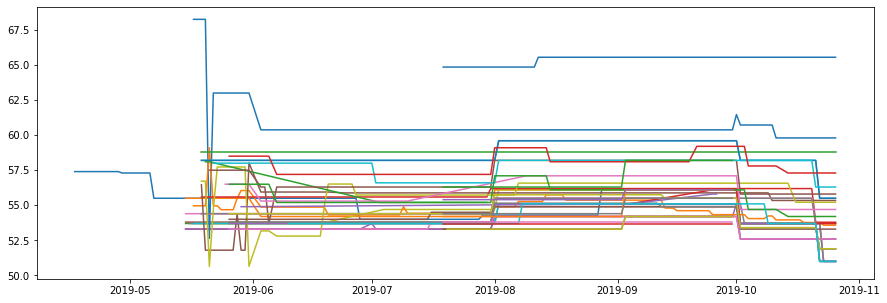

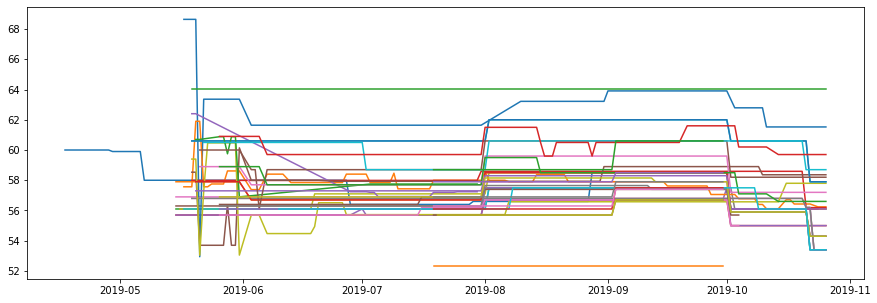

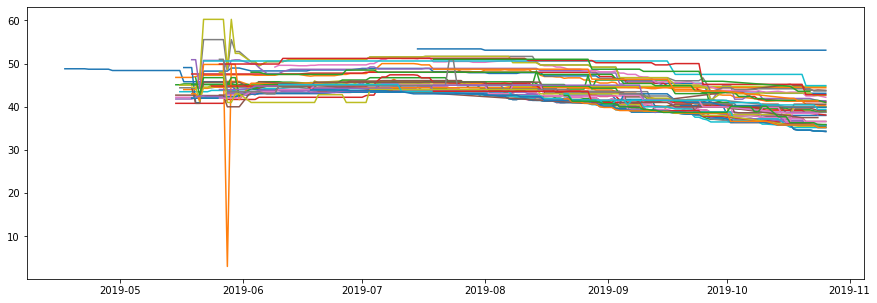

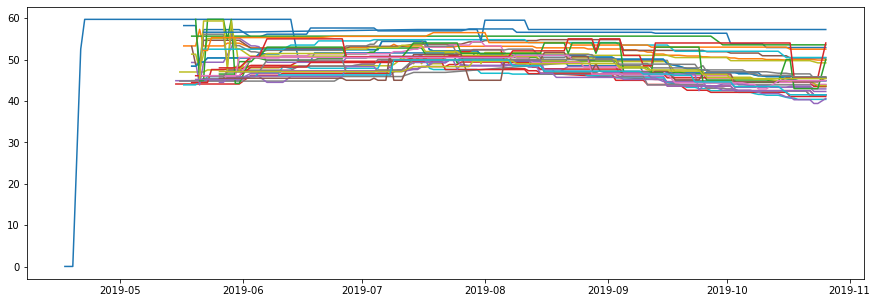

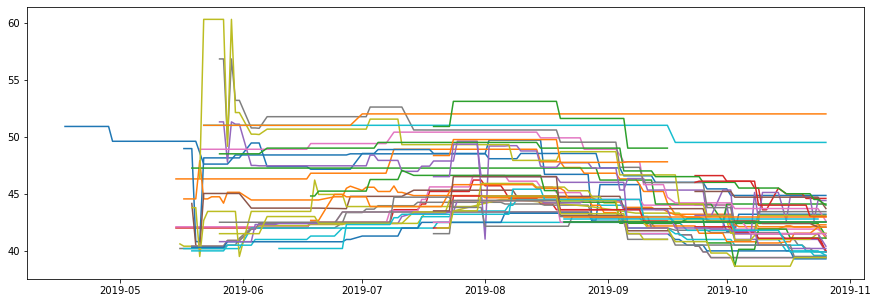

...

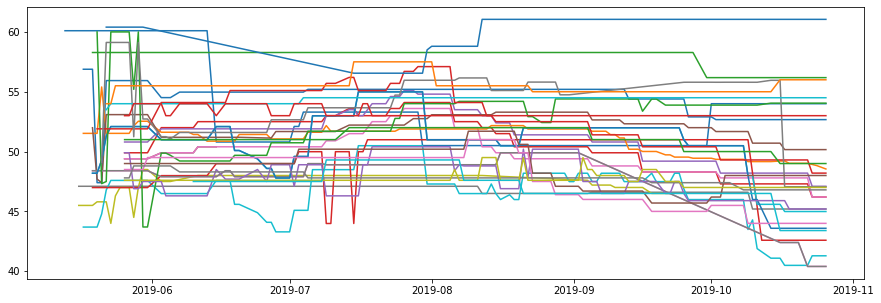

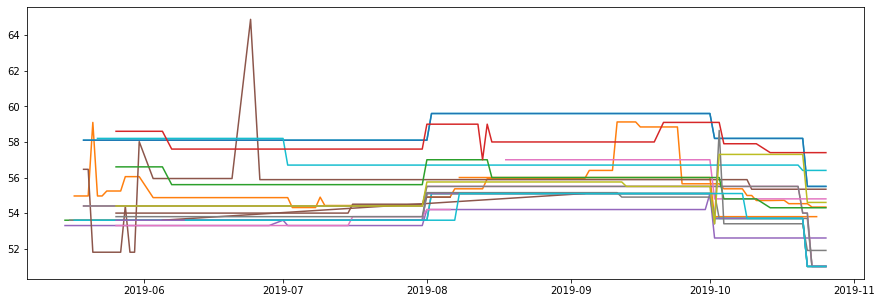

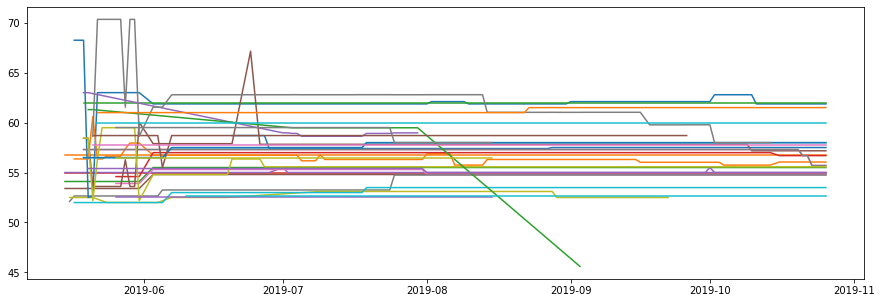

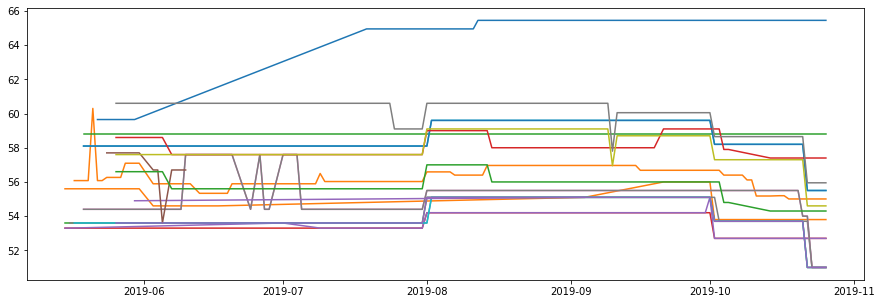

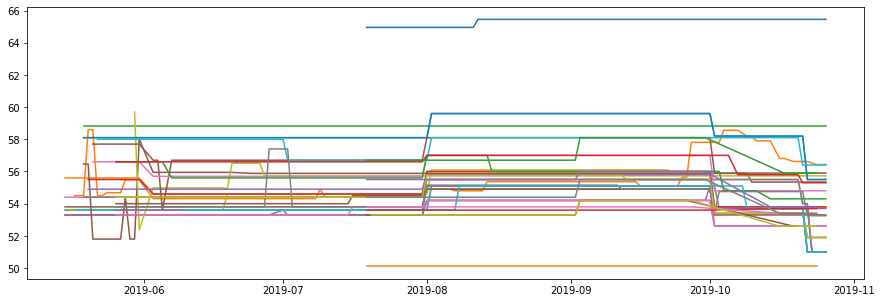

In [8]:
for tovar in tovars:
    plt.figure(figsize=(15,5))
    for mag in mags:
        plt.plot(
            parser[(parser.mag==mag)&(parser.tovar==tovar)].date,
            parser[(parser.mag==mag)&(parser.tovar==tovar)].price/1000,
            label=tovar
        )
    plt.show()

In [9]:
balka = parser[parser.cat=='Балка']
balka.shape

(75739, 7)

In [10]:
cats = parser.cat.unique()
for c in cats:
    name = str(c)
    table = parser[parser.cat == c]
    table.to_csv('data/parser_'+name+'.csv')

In [11]:
print((parser.price<30000).sum())
strange_df = parser[parser.price<30000]
parser[parser.price<30000].head(20)

294


,id,cat,tovar,mag,price,date,okrug
3,43PА1,Труба,"Труба ВГП 15х2,8",Оммет-ОМС,68.99,2019-04-17,СФО
8,43RА1,Труба,"Труба ВГП 20х2,8",Оммет-ОМС,88.35,2019-04-17,СФО
10,43ZА1,Труба,"Труба ВГП 50х3,5",Оммет-ОМС,238.63,2019-04-17,СФО
27,47OА1,Труба,"Труба электросварная 89х3,5",Оммет-ОМС,358.29,2019-04-17,СФО
28,43XА1,Труба,"Труба ВГП 40х3,5",Оммет-ОМС,191.23,2019-04-17,СФО
51,47IА1,Труба,"Труба электросварная 76х3,5",Оммет-ОМС,303.80,2019-04-17,СФО
54,464А1,Труба,"Труба электросварная 159х4,5",Оммет-ОМС,727.01,2019-04-17,СФО
63,43VА1,Труба,"Труба ВГП 32х3,2",Оммет-ОМС,157.28,2019-04-17,СФО
67,47DА1,Труба,"Труба электросварная 57х3,5",Оммет-ОМС,228.23,2019-04-17,СФО
91,45OА1,Труба,"Труба электросварная 108х3,5",Оммет-ОМС,437.45,2019-04-17,СФО


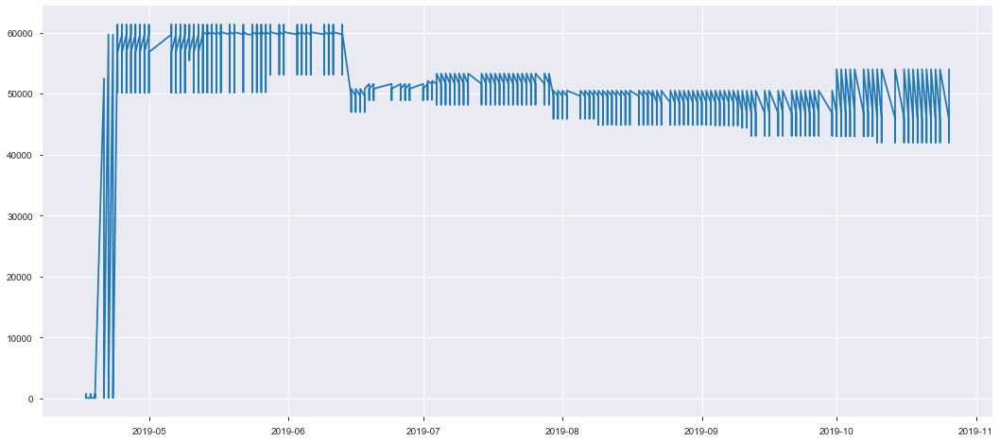

In [8]:
plt.figure(figsize=(18,8))
plt.plot(
    parser[(parser['cat']=='Труба')&(parser.mag=='Оммет-ОМС')]['date'],
    parser[(parser['cat']=='Труба')&(parser.mag=='Оммет-ОМС')]['price']
)

In [13]:
strange_df.cat.unique()

array(['Труба', 'Арматура', 'Угол', 'Лист', 'Швеллер', 'Круг', 'Катанка',
       'Квадрат', 'Полоса', 'Балка'], dtype=object)

In [9]:
parser.groupby('okrug')['mag'].value_counts()  ## Распечатал по округам всех поставщиков, по количеству продаже ВСЕГО подряд
    

okrug   mag            
Москва  МС-МСК             13289
        ДиПОС-МСК          12250
        А групп-МСК        11285
        МКМ-МСК            10959
        Мечел-МСК           8544
        БИC-МСК             7409
        ЕМИ-МСК             4267
        Северсталь-МСК      1316
        НЛМК(калуг)-МСК      728
        НЛМК(одинц)-МСК      720
        НЛМК(лип)-МСК        428
СФО     Оммет-ОМС          15247
        Темерсо-ИРК        12776
        Тримет-ТМН         12713
        СПК-ТМН            10952
        МС-НСК             10796
        А групп-НСК         9984
        А групп-КАЯ         9448
        Мечел-КАЯ           9362
        ФТ-ИРК              9259
        СПК-ОМС             8539
        Мечел-НСК           8476
        Мечел-ТМН           8193
        СПК-ИРК             7827
        УСМ-ИРК             7668
        Мечел-ОМС           6918
        СПК-КАЯ             6875
        СПК-НСК             6756
        Мечел-ИРК           5970
        ЕМИ-ИРК    

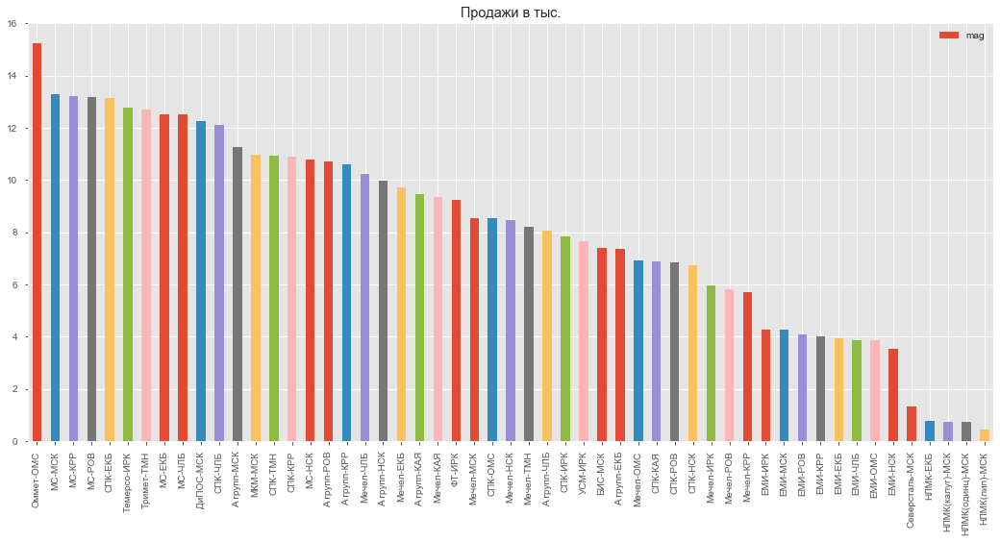

In [13]:
plt.style.use('ggplot')  # То же самое,что выше, но в виде графика и без разбивки по округам
plt.rcParams['figure.figsize'] = (18, 8)  # 
(parser['mag'].value_counts()/1000).plot(kind='bar',title='Продажи в тыс.')
plt.legend()
plt.savefig('Продажи поставщиками в тыс шт.png')

In [14]:
import numpy as np
grouped = parser.groupby(by=['tovar','date']).aggregate(np.mean)
grouped.head(20)

price
tovar                      date               
Арматура рифленая 10 25Г2С 2019-04-17  42600.0
                           2019-04-18  42600.0
                           2019-04-19  42600.0
                           2019-04-21  42600.0
                           2019-04-22  42600.0
                           2019-04-23  42600.0
                           2019-04-24  42600.0
                           2019-04-25  42600.0
                           2019-04-26  42600.0
                           2019-04-27  42600.0
                           2019-04-28  42600.0
                           2019-04-29  46600.0
                           2019-04-30  46600.0
                           2019-05-01  46600.0
                           2019-05-06  46600.0
                           2019-05-07  46600.0
                           2019-05-08  46600.0
                           2019-05-09  46600.0
                           2019-05-11  46600.0
                           2019-05-12  46600.0

In [17]:
parser.groupby(by=['tovar','date']).aggregate(np.median)

price
tovar                       date                
Арматура рифленая 10 25Г2С  2019-04-17  42600.00
                            2019-04-18  42600.00
                            2019-04-19  42600.00
                            2019-04-21  42600.00
                            2019-04-22  42600.00
...                                          ...
Швеллер горячекатаный 8 Ст3 2019-10-21  42437.14
                            2019-10-22  42500.00
                            2019-10-23  41800.00
                            2019-10-24  42500.00
                            2019-10-26  42843.12

[16847 rows x 1 columns]

In [18]:
pd.set_option('display.max_columns',15)
parser_ommet = parser[parser.mag=='Оммет-ОМС']


In [19]:
parser_mean = parser.groupby(by=['tovar','date']).aggregate(np.mean).reset_index()
parser_mean.head(20)

,tovar,date,price
0,Арматура рифленая 10 25Г2С,2019-04-17,42600.0
1,Арматура рифленая 10 25Г2С,2019-04-18,42600.0
2,Арматура рифленая 10 25Г2С,2019-04-19,42600.0
3,Арматура рифленая 10 25Г2С,2019-04-21,42600.0
4,Арматура рифленая 10 25Г2С,2019-04-22,42600.0
5,Арматура рифленая 10 25Г2С,2019-04-23,42600.0
6,Арматура рифленая 10 25Г2С,2019-04-24,42600.0
7,Арматура рифленая 10 25Г2С,2019-04-25,42600.0
8,Арматура рифленая 10 25Г2С,2019-04-26,42600.0
9,Арматура рифленая 10 25Г2С,2019-04-27,42600.0


In [20]:
parser_ommet.merge(parser_mean['price'])


,id,cat,tovar,mag,price,date,okrug
0,35BА1,Балка,Балка двутавровая 40Б Ст3,Оммет-ОМС,57400.0,2019-04-17,СФО
1,35BА1,Балка,Балка двутавровая 40Б Ст3,Оммет-ОМС,57400.0,2019-04-17,СФО
2,35BА1,Балка,Балка двутавровая 40Б Ст3,Оммет-ОМС,57400.0,2019-04-17,СФО
3,35BА1,Балка,Балка двутавровая 40Б Ст3,Оммет-ОМС,57400.0,2019-04-17,СФО
4,35BА1,Балка,Балка двутавровая 40Б Ст3,Оммет-ОМС,57400.0,2019-04-17,СФО
...,...,...,...,...,...,...,...
392288,3OAА1,Лист,Лист горячекатаный 20 Ст3,Оммет-ОМС,46200.0,2019-10-18,СФО
392289,3O3А1,Лист,Лист горячекатаный 16 Ст3,Оммет-ОМС,46200.0,2019-10-19,СФО
392290,3OAА1,Лист,Лист горячекатаный 20 Ст3,Оммет-ОМС,46200.0,2019-10-19,СФО
392291,3O3А1,Лист,Лист горячекатаный 16 Ст3,Оммет-ОМС,46200.0,2019-10-20,СФО


In [33]:
#parser.groupby(by=['cat','date']).head(20)
mean_cat_price = parser.groupby(by=['cat','date']).median()
mean_cat_price.price.astype(np.float)
mean_cat_price.columns


Index(['price'], dtype='object')

TypeError: unhashable type: 'numpy.ndarray'

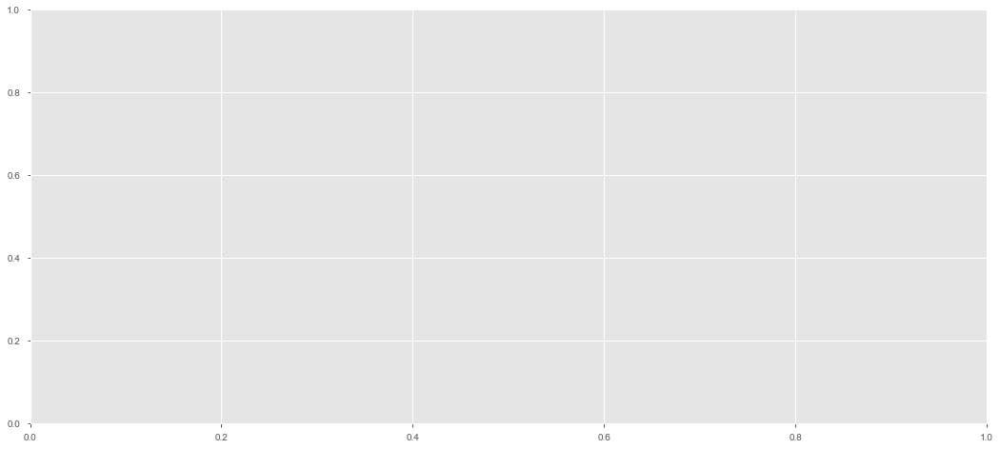

In [21]:
plt.rcParams['figure.figsize'] = (18, 8)
plt.plot(parser.groupby(by=['cat','date']).date,
             mean_cat_price.price
    )
plt.show()


In [23]:
mean_cat_price.to_csv('data/mean.csv')

In [24]:

plt.rcParams['figure.figsize'] = (18, 8)
df_mean = pd.read_csv('data/mean.csv')

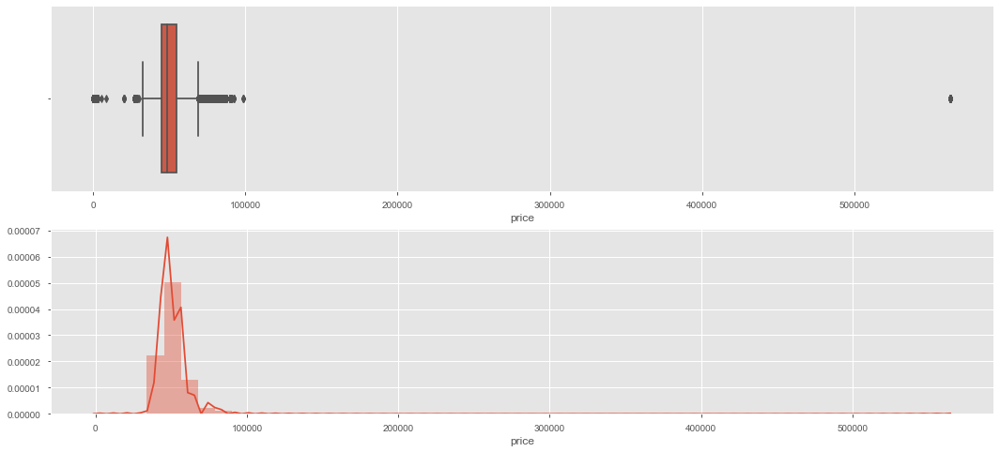

In [34]:
import seaborn as sns
f,axes = plt.subplots(2,1)
sns.boxplot(parser.price, ax=axes[0])
sns.distplot(parser.price,ax=axes[1])

In [35]:
max_price = parser[parser.price>100000]
max_price.shape

(26, 7)

In [36]:
max_price.sort_values(by=['date']).head(26)

,id,cat,tovar,mag,price,date,okrug
329942,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-18,СФО
333486,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-19,СФО
337041,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-21,СФО
340486,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-22,СФО
343982,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-23,СФО
347545,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-24,СФО
351112,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-25,СФО
354679,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-26,СФО
358189,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-27,СФО
361623,34EА1,Балка,Балка двутавровая 25К Ст3,Темерсо-ИРК,563200.0,2019-09-30,СФО


Наверное эти цены нужно поделить на 10, судя по остальным магазинам.

In [37]:
example = parser[(parser.tovar=='Балка двутавровая 25К Ст3')&(parser.mag=='Оммет-ОМС')&(parser.date>'2019-09-18')]
example.head(20)

,id,cat,tovar,mag,price,date,okrug
333512,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-19,СФО
337068,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-21,СФО
340512,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-22,СФО
344007,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-23,СФО
347570,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-24,СФО
351137,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-25,СФО
354704,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-26,СФО
358212,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-27,СФО
361648,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-09-30,СФО
364880,34EА1,Балка,Балка двутавровая 25К Ст3,Оммет-ОМС,56100.0,2019-10-01,СФО


In [94]:
parser = parser.drop(['id','mag','okrug'],axis=1)
parser.head()

,cat,tovar,price,date
0,Балка,Балка двутавровая 40Б Ст3,57400.00,2019-04-17
1,Балка,Балка двутавровая 20К Ст3,60000.00,2019-04-17
2,Арматура,Арматура рифленая 10 А500 СП,48800.00,2019-04-17
3,Труба,"Труба ВГП 15х2,8",68.99,2019-04-17
4,Угол,Уголок горячекатаный 63х63х6 Ст3,50900.00,2019-04-17


In [100]:
parser.date = parser.date.apply(pd.to_datetime)

In [101]:
p_grouped = parser.groupby(['cat','date']).price.median().reset_index()
p_grouped.head(20)

,cat,date,price
0,Арматура,2019-04-17,42700.0
1,Арматура,2019-04-18,42700.0
2,Арматура,2019-04-19,42800.0
3,Арматура,2019-04-21,42800.0
4,Арматура,2019-04-22,42800.0
5,Арматура,2019-04-23,42700.0
6,Арматура,2019-04-24,42700.0
7,Арматура,2019-04-25,42700.0
8,Арматура,2019-04-26,42700.0
9,Арматура,2019-04-27,42700.0


In [103]:
p_grouped[p_grouped.price<34000]

,cat,date,price
1123,Труба,2019-04-17,228.23
1124,Труба,2019-04-18,217.14
1125,Труба,2019-04-19,217.14
1126,Труба,2019-04-21,347.20
1127,Труба,2019-04-22,392.27
1128,Труба,2019-04-23,392.27


In [104]:

p_grouped.shape
p_grouped = p_grouped.loc[p_grouped.price>34000]
p_grouped.shape

(1602, 3)

In [109]:
p_grouped = p_grouped.loc[p_grouped.price< 62000]

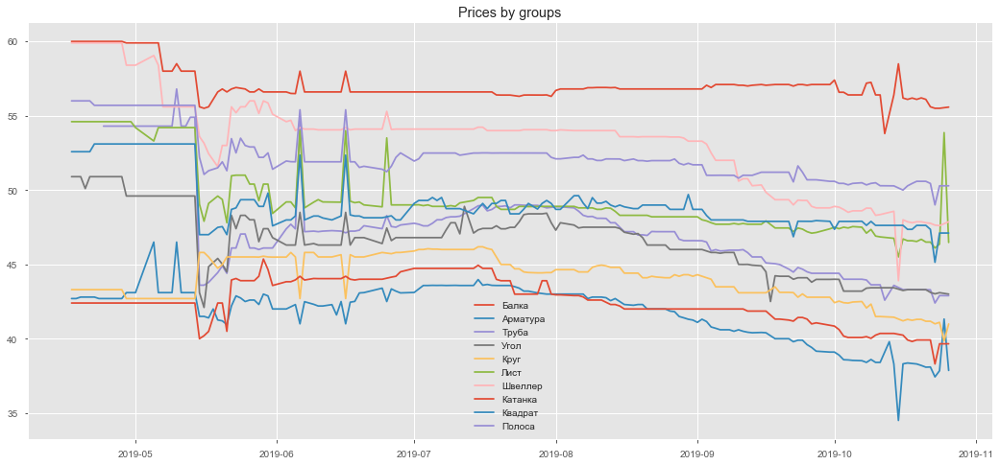

In [111]:
for c in cats:
    plt.plot(p_grouped[p_grouped.cat==c]['date'],p_grouped[p_grouped.cat==c].price/1000, label=c)
    
plt.title('Prices by groups')
plt.legend()
plt.savefig('Prices_by_groups_all.png')
plt.show()

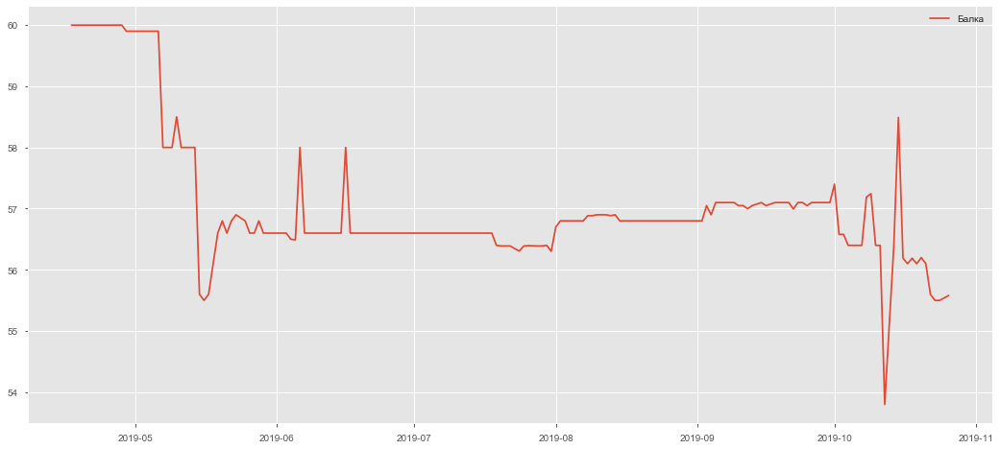

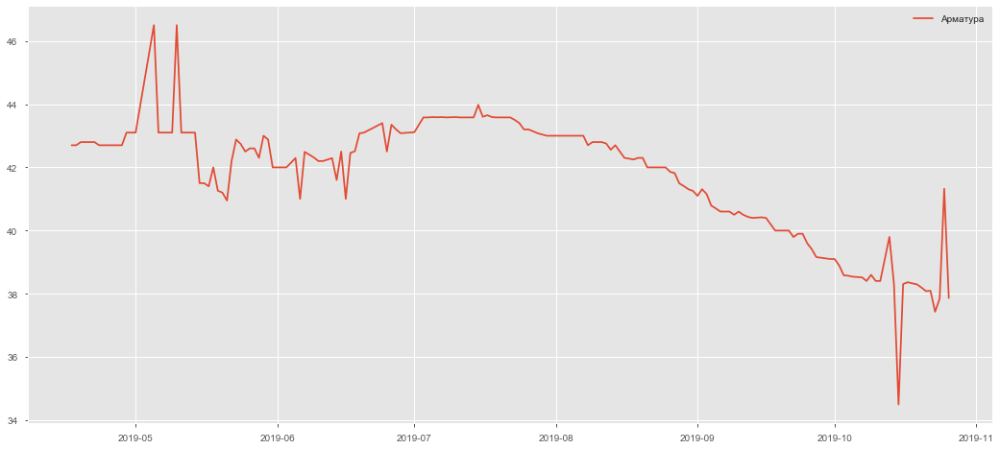

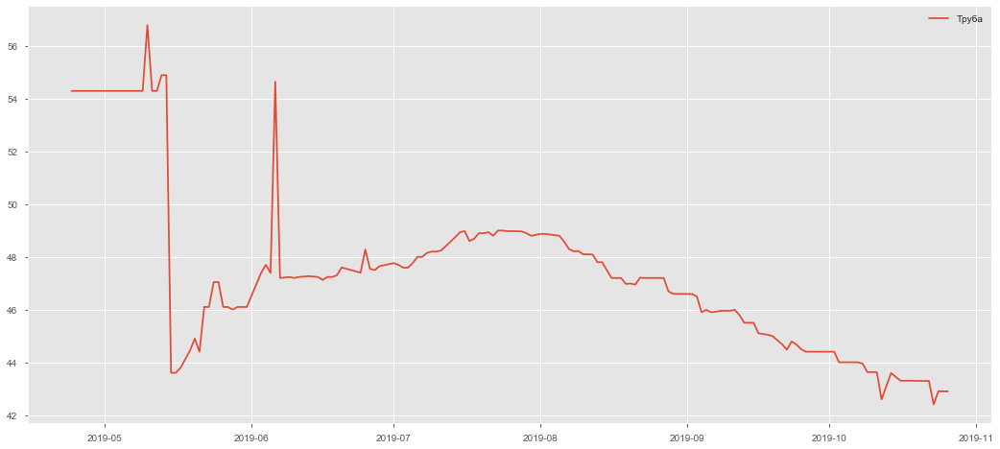

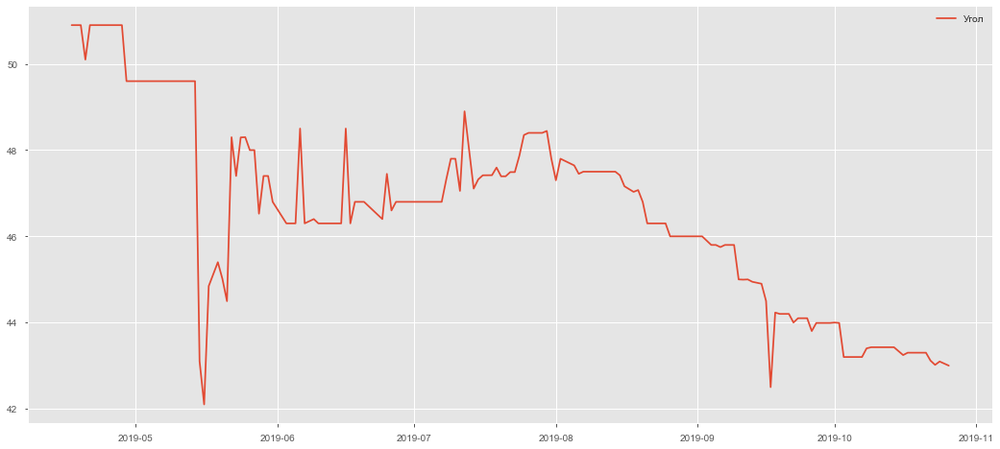

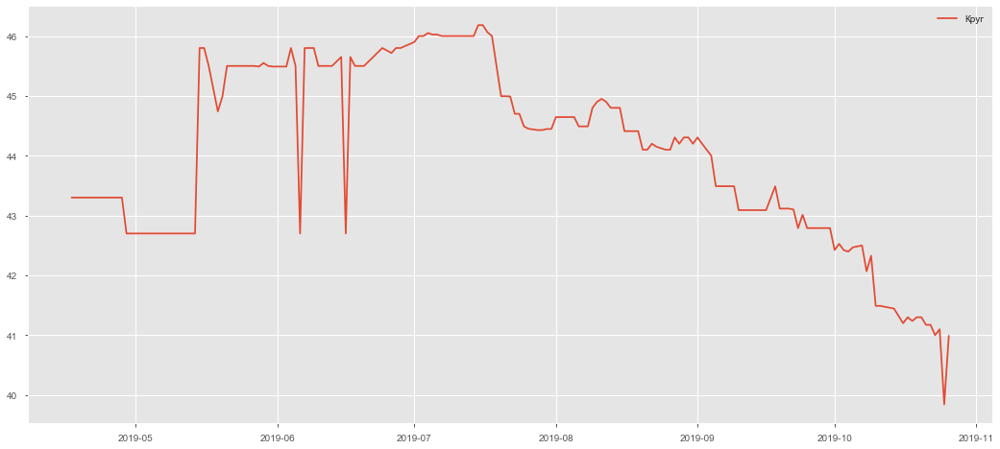

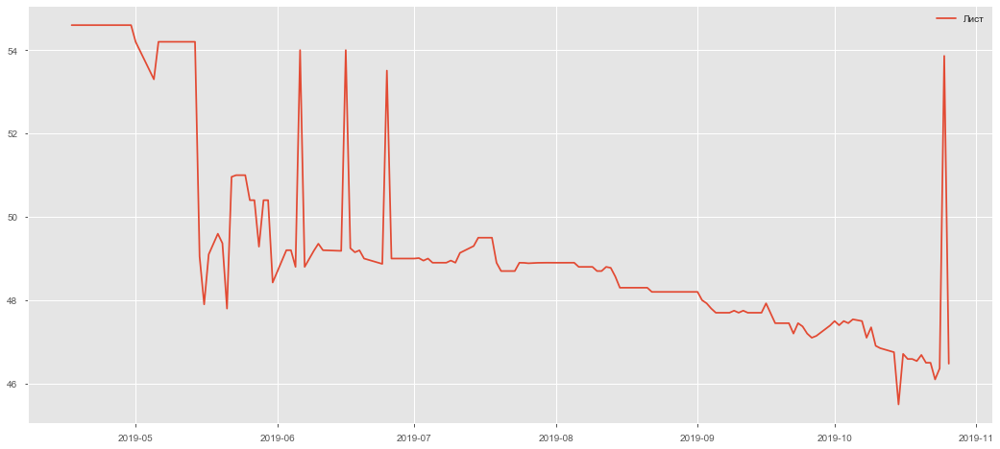

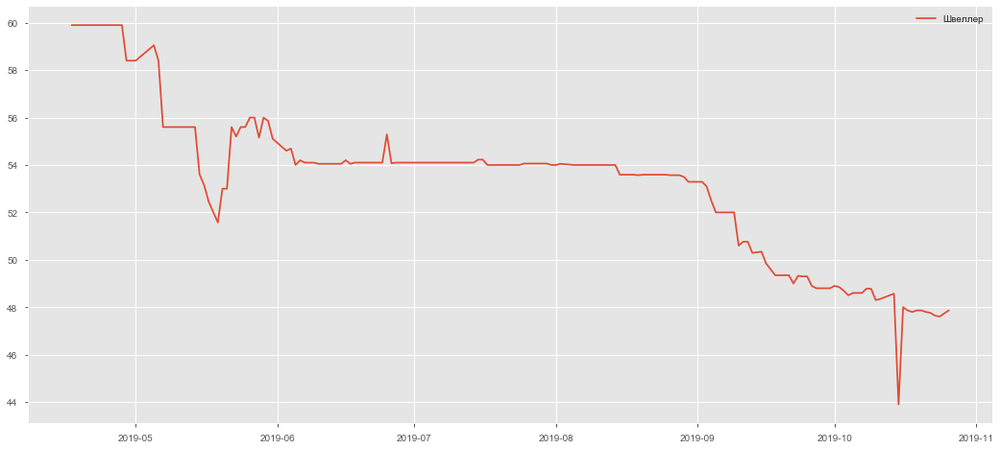

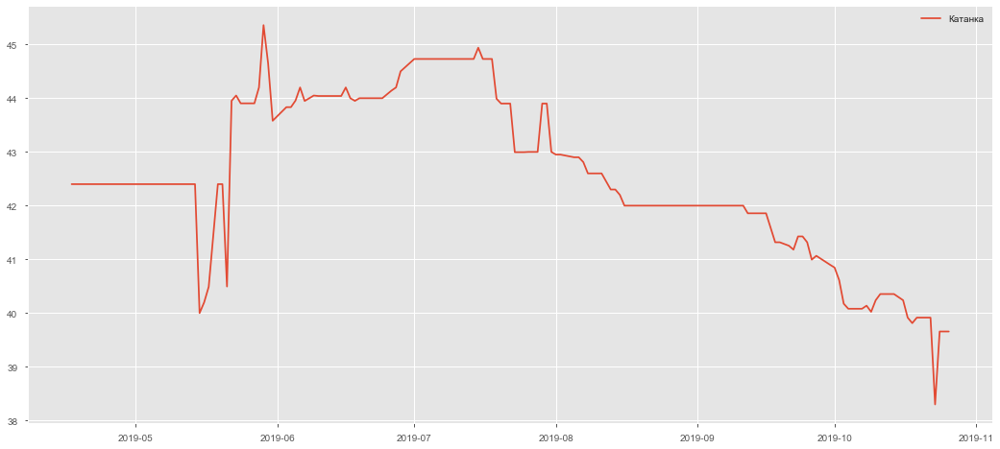

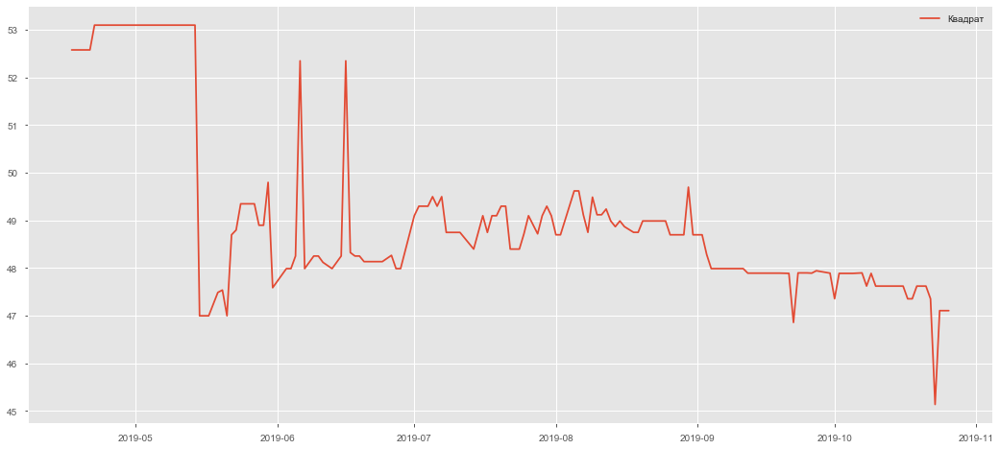

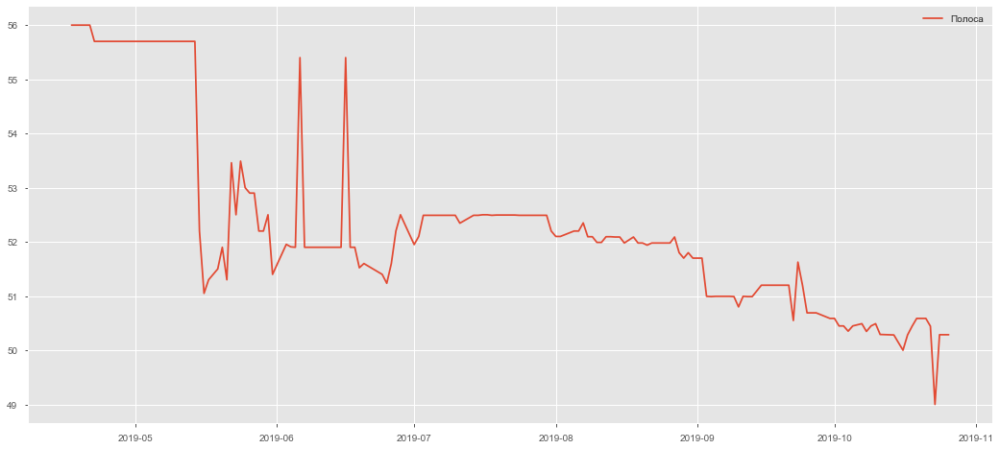

No handles with labels found to put in legend.


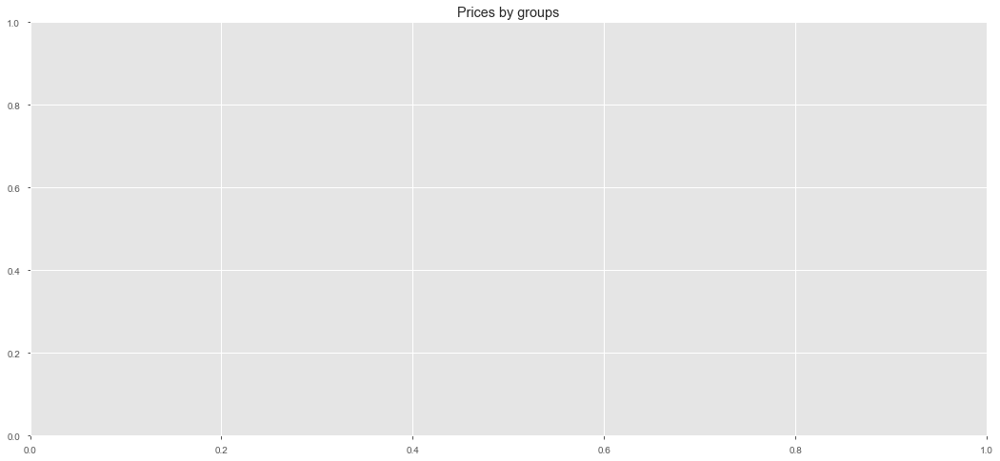

In [114]:
for c in cats:
    plt.plot(p_grouped[p_grouped.cat==c]['date'],p_grouped[p_grouped.cat==c].price/1000, label=c)
    plt.legend()
    plt.show()
    
plt.title('Prices by groups')
plt.legend()
plt.savefig('Prices_by_groups_all.png')


In [152]:
dateparse = lambda dates: [pd.datetime.strptime(d, '%Y.%m.%d %H.%M.%S') for d in dates]
cbp = pd.read_csv('data/dbo_SuppliesDinamicCBP.txt',sep=';',decimal=',',parse_dates=['dt'])
cbp.head()                  

,id,nom,fil,dt,tm,val,r
0,1,35H,1А1,2015-01-19,570350000,33704.0,98
1,2,35H,1А1,2015-01-30,595780000,33704.0,99
2,3,35H,1А1,2015-09-02,487100000,33704.0,101
3,4,35H,1А1,2015-02-17,316610000,33704.0,102
4,5,35H,1А1,2015-02-19,545430000,33704.0,103


In [153]:
cbp = cbp.drop(['id','nom','tm','r','fil'],axis=1)
cbp.head()

,dt,val
0,2015-01-19,33704.0
1,2015-01-30,33704.0
2,2015-09-02,33704.0
3,2015-02-17,33704.0
4,2015-02-19,33704.0


In [157]:
cbp['dt'] = cbp.dt.apply(pd.to_datetime)
cbp['val'] = cbp.val.apply(np.float)
cbp.columns

Index(['dt', 'val'], dtype='object')

In [168]:
pp.ProfileReport(cbp)

In [170]:
print(cbp.shape)
cbp = cbp.loc[(cbp.val!=cbp.val.max()) &(cbp.val!=cbp.val.min())]
print(cbp.shape)

(293744, 2)
(293723, 2)


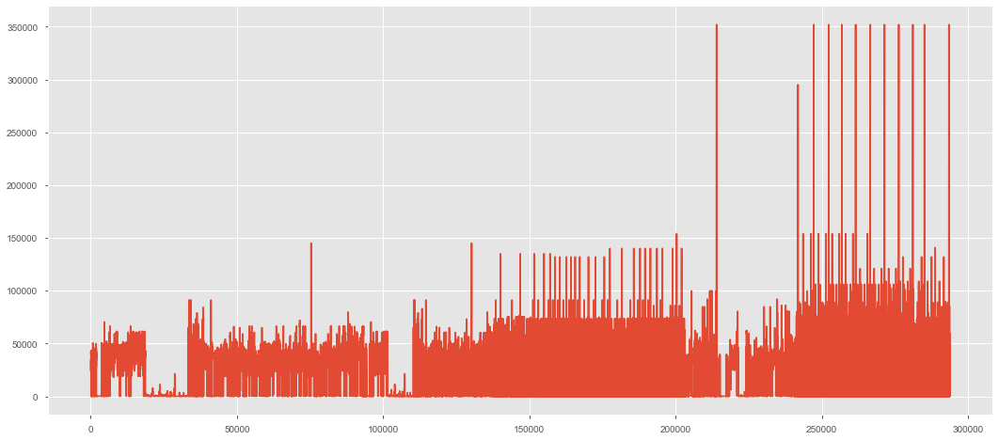

In [171]:
cbp.val.plot()

In [73]:
kvadrat = pd.read_csv('data/parser_Квадрат.csv')
kvadrat.head()

,Unnamed: 0,id,cat,tovar,mag,price,date,okrug
0,42,3E2А1,Квадрат,Квадрат горячекатаный 14 Ст3,Оммет-ОМС,51810.0,2019-04-17,СФО
1,50,3E5А1,Квадрат,Квадрат горячекатаный 18 Ст3,Оммет-ОМС,53350.0,2019-04-17,СФО
2,66,3E3А1,Квадрат,Квадрат горячекатаный 16 Ст3,Оммет-ОМС,51810.0,2019-04-17,СФО
3,96,3E1А1,Квадрат,Квадрат горячекатаный 12 Ст3,Оммет-ОМС,53900.0,2019-04-17,СФО
4,144,3E2А1,Квадрат,Квадрат горячекатаный 14 Ст3,Оммет-ОМС,51810.0,2019-04-18,СФО


In [39]:
kvadrat.shape

(10114, 8)

In [43]:
kvadrat.tovar.unique()

array(['Квадрат горячекатаный 14 Ст3', 'Квадрат горячекатаный 18 Ст3',
       'Квадрат горячекатаный 16 Ст3', 'Квадрат горячекатаный 12 Ст3'],
      dtype=object)

tovar
Квадрат горячекатаный 12 Ст3    AxesSubplot(0.125,0.125;0.775x0.755)
Квадрат горячекатаный 14 Ст3    AxesSubplot(0.125,0.125;0.775x0.755)
Квадрат горячекатаный 16 Ст3    AxesSubplot(0.125,0.125;0.775x0.755)
Квадрат горячекатаный 18 Ст3    AxesSubplot(0.125,0.125;0.775x0.755)
Name: price, dtype: object

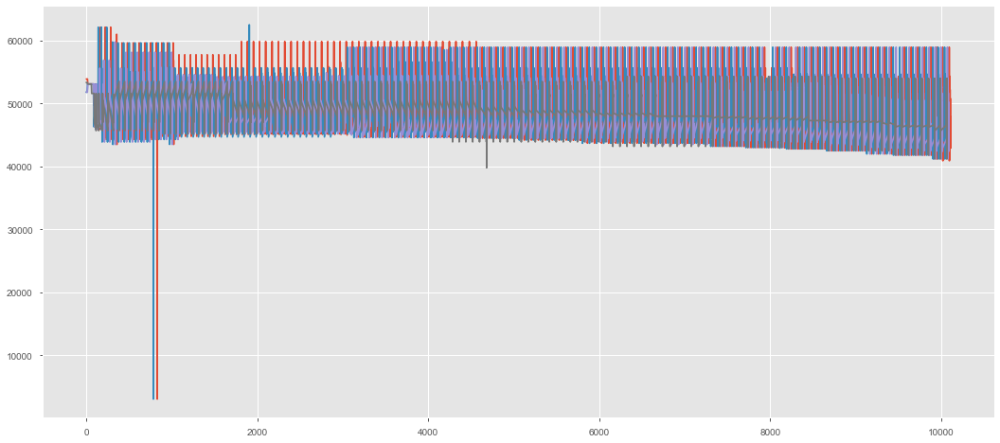

In [45]:
kvadrat.groupby(by=['tovar']).price.plot()

In [46]:
import pandas_profiling as pp
pp.ProfileReport(kvadrat)

In [56]:
kvadrat.date = kvadrat['date'].apply(pd.to_datetime)
kvadrat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10114 entries, 0 to 10113
Data columns (total 8 columns):
Unnamed_0    10114 non-null int64
id           10114 non-null object
cat          10114 non-null object
tovar        10114 non-null object
mag          10114 non-null object
price        10114 non-null float64
date         10114 non-null datetime64[ns]
okrug        10114 non-null object
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 632.2+ KB


In [68]:
kvadrat[kvadrat.price<39000]


,Unnamed_0,id,cat,tovar,mag,price,date,okrug
786,25987,3E2А1,Квадрат,Квадрат горячекатаный 14 Ст3,СПК-РОВ,3044.27,2019-05-28,ЮФО
832,27495,3E1А1,Квадрат,Квадрат горячекатаный 12 Ст3,СПК-РОВ,3044.27,2019-05-28,ЮФО


In [74]:
print(kvadrat.shape)
kvadrat = kvadrat.loc[kvadrat.price>39000]
print(kvadrat.shape)

(10114, 8)
(10112, 8)


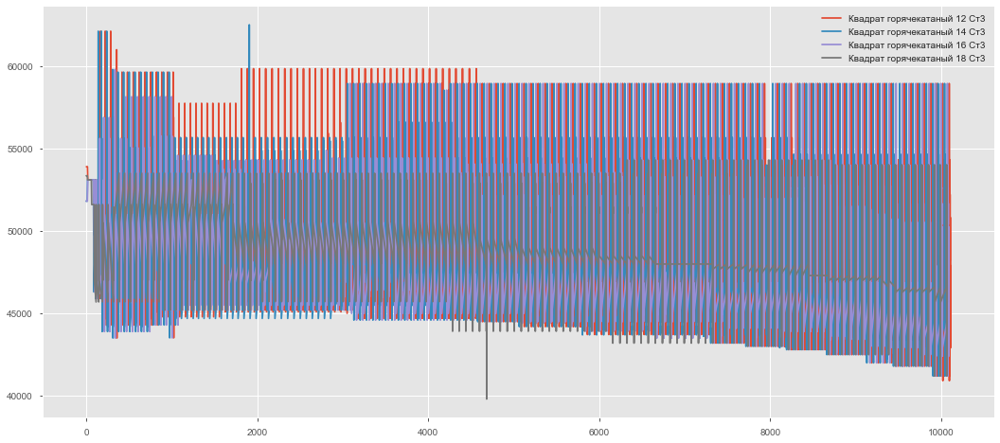

In [76]:
plt.figure(figsize=(18,8))
kvadrat.groupby(by=['tovar']).price.plot()
plt.legend()

In [87]:
#kvadrat = kvadrat.drop(['id','mag','okrug','Unnamed: 0'],axis=1)
kvadrat = kvadrat.drop(['cat'],axis=1)
kvadrat.head(10)

,tovar,price,date
0,Квадрат горячекатаный 14 Ст3,51810.0,2019-04-17
1,Квадрат горячекатаный 18 Ст3,53350.0,2019-04-17
2,Квадрат горячекатаный 16 Ст3,51810.0,2019-04-17
3,Квадрат горячекатаный 12 Ст3,53900.0,2019-04-17
4,Квадрат горячекатаный 14 Ст3,51810.0,2019-04-18
5,Квадрат горячекатаный 18 Ст3,53350.0,2019-04-18
6,Квадрат горячекатаный 16 Ст3,51810.0,2019-04-18
7,Квадрат горячекатаный 12 Ст3,53900.0,2019-04-18
8,Квадрат горячекатаный 14 Ст3,51810.0,2019-04-19
9,Квадрат горячекатаный 18 Ст3,53350.0,2019-04-19


No handles with labels found to put in legend.


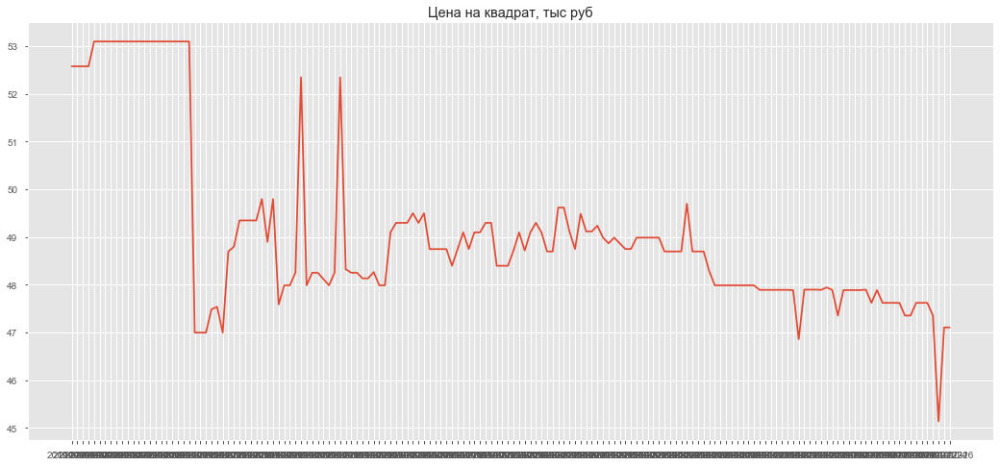

In [91]:
grouped = kvadrat.groupby('date').price.median().reset_index()
plt.figure(figsize=(18,8))
plt.plot(grouped.date, grouped.price/1000, )
plt.title('Цена на квадрат, тыс руб')
plt.legend()